# Homework 1

## Exercise 1-1

a) $f(x) = cos(x^3)$

Using the chain rule : $\left( f(g(x)) \right) = f'(g(x)) \cdot g'(x)$

$$
\frac{df}{dx} = - 3x^2\cdot sin(x)
$$


b) $f(x) = x^x$

````{div} full-width
$$
\begin{align}
\ln{f(x)} &= \ln(x^x) &\quad{\text{Taking the log of both sides}}\\
\frac{d \ln(f(x))}{dx} &= \frac{d(x\ln{x})}{dx} &\quad{\text{Derivative of both sides}}\\
f'(x)\frac{1}{f(x)}&= x\cdot\frac{1}{x} + \ln{x}\cdot 1 &\quad{\text{Chain rule on the left hand side, product rule on the right}}\\
f'(x) &= (1 + \ln{x})\cdot f(x) &\quad{\text{Solving for f'x and pluging in f(x)}}\\
f'(x) &= (1 + \ln{x})\cdot x^x
\end{align}
$$
````

c) $f(x) = e^{sin(2x)}cos(x)$


$$

$$

````{div} full-width
$$
\begin{align}
f'(x) &= -e^{sin(2x)}sin(x) + cos(x)e^{sin(2x)}2cos(2x) &\quad{\text{Using the product rule on f(x), then chain rule on the parts}}\\ 
&= -e^{sin(2x)}sin(x) + 2cos(2x)cos(x)e^{sin(2x)} &\quad{\text{Rearranging}}\\
&= e^{sin(2x)}(-sin(x) + 2cos(2x)cos(x))\\
\end{align}
$$
````

d) Compute the derivative ($\frac{df}{dx}, \frac{df}{dy}$) of $f(x,y) = cos(x^2(t) + y^2(t))$, with respect to $t$, assuming that $x(t), y(t)$ vary with time. Write the answers in terms of $\frac{dx}{dt}, \frac{dy}{dt}$.


Recall the multivariate chain rule

$$
\frac{df(x(t),y(t))}{dxdy} = \frac{df}{dx} \frac{dx}{dt} + \frac{df}{dy} \frac{dy}{dt}
$$


````{div} full-width
$$
\begin{align}
\frac{df}{dx}\frac{dx}{dt} &= -sin(x^2(t) + y^2(t))\cdot2x(t)\frac{dx}{dt} &\quad{\text{Derive f(x) w.r.t $x$, then x w.r.t $t$}}\\
\frac{df}{dy} \frac{dy}{dt} &= -sin(x^2(t) + y^2(t))\cdot2y(t)\frac{dy}{dt} &\quad{\text{Derive f(x) w.r.t $y$, then y w.r.t $t$}}\\
\frac{df(x(t),y(t))}{dxdy} &= (-sin(x^2(t) + y^2(t))\cdot2x(t)\frac{dx}{dt} )+ (-sin(x^2(t) + y^2(t))\cdot2y(t)\frac{dy}{dt})\\
                         &= -2sin(x^2(t) + y^2(t))(x(t)\frac{dx}{dt} + y(t)\frac{dy}{dt})
\end{align}
$$
````

## Exercise 1-2

```{note}
I believe this should be $-\lambda x$ for a decaying situation
```

Given that mass $x$ of a radioactive element obeys the following differential equation in time :

$$
\dot{x} = -\lambda x
$$

a) Write down the solution to $x(t)$ describing the rate of decay

````{div} full-width
Start by taking the integral of both sides

$$
\begin{align}
\frac{dx(t)}{dt} &= -\lambda x(t)\\
\frac{dx(t)}{x(t)} &= -\lambda dt &\quad{\text{Move all $x$ terms to one side}}\\
\int{\frac{dx(t)}{x(t)}} &= \int{-\lambda dt} \\
\ln{x(t)} &= -\lambda t + C &\quad{\text{Recalling the integral of 1/x, adding + C to account for constants }}\\
x(t) &= e^{-\lambda t + C} &\quad{\text{Taking the exponent of both sides}} \\
x(t) &= e^{-\lambda t }k &\quad{\text{Recalling the property of exponents $e^{a+b} = e^ae^b$, let $k = e^C$}}
\end{align}
$$

To get the value of $k$, we can set $t=0$ and get that $k = x(0)$, which is our intiial condition.
````

In [2]:
x_0 = 2
t_range = 1:1:5
lambdas = [5,1,0,0.01,0.1];

<!-- # function get_vals(lambdas::Array{Float64},t_range::StepRange{Int64,Int64}, x_0::Int64)
#     out =[]
#     for l in lambdas
#         for_l = []
#         for t in t_range
#             val = x(t,l,x_0)
#             push!(for_l,val)
#         end
#         push!(out,for_l)
#     end
#     out   
# end -->


In [3]:
function getvals(lambdas::Vector{Float64}, t_range::StepRange{Int,Int},x_0::Int64)
    # pre-allocate the output array with the appropriate type and size
    # avoid the need for dynamic resizing and multiple heap allocations. 
    # reduces memory fragmentation and improves performance by ensuring all memory is allocated upfront
    out = Vector{Vector{Float64}}(undef,length(lambdas))
    for (i,l) in enumerate(lambdas) 
        # Pre-allocate innnter vector 'for_l' with the correct size to avoid multiple allocations
        for_l = Vector{Float64}(undef, length(t_range)+1)
        for_l[1] = x_0
        for (j,t) in enumerate(t_range)
            val = exp(-l*t)*x_0
            for_l[j+1] = val #direct assignment of pre-allocated array instead of push
        end
        out[i] = for_l #direct assignment of pre-allocated array instead of push 
    end
    out
end

getvals (generic function with 1 method)

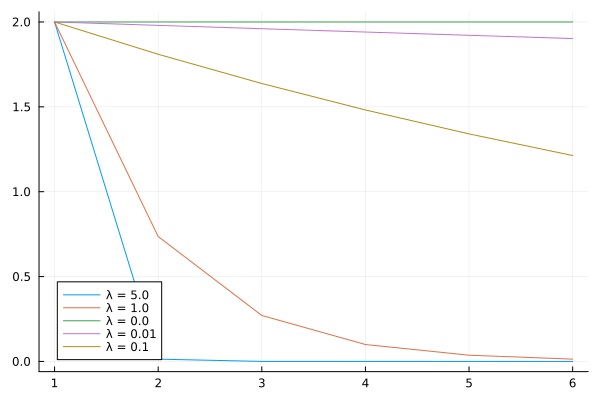

In [4]:
using Plots

labels = ["λ = $i" for i in lambdas]
p = plot()
for (i,series) in enumerate(getvals(lambdas,t_range,x_0))
    plot!(p,series,label = labels[i])
end
display(p)

c) The half-life T is defined as the time it takes for the material to be reduced to half of its mass through radioactive decay. The half-life of uranium-238 is 4.468 billion years. What is the corresponding value of λ?

````{div} full-width
we need $\lambda$ such that:

$$
\begin{align}
x(4.468 \times 10^6) &= \frac{x_0}{2} &\quad{\text{$x$ at $t = 4.468 \times 10^6$ is half of initial value}} \\
\frac{x_0}{2} &= x(4.468 \times 10^6) = e^{-\lambda 4.468 \times 10^6}x_0 &\quad{\text{Substituting the values to the solution above}}\\
\frac{1}{2} &= e^{-\lambda 4.468 \times 10^6} &\quad{\text{Dividing both sides by $x_0$}}\\
\ln{\frac{1}{2} } &= -\lambda 4.468 \times 10^6 &\quad{\text{Taking the natural log of both sides, $\ln(e^x) = x$}}\\
- \ln{(\frac{1}{2})\cdot \frac{1}{4.468 \times 10^6} } &= \lambda &\quad{\text{Solving for $\lambda$}}\\
\lambda &= 1.551\times 10^-7
\end{align}
$$

````{div} full-width

d) If you start with 100kg of uranium-238, how long until you only have 5kg left?

We need $t$ such that $x(0)  = 100$ and $x(t) = 5$

$$
\begin{align}
5 &= e^{-(1.551\times 10^{-7})t}100 &\quad{\text{Substituting the desired weight, $\lambda$, and $x_0$}}\\
\ln{5} &= -100(1.551\times 10^{-7})t &\quad{\text{Solve for $t$}}\\
\end{align}
$$

$$

$$

## Exercise 1-3

Compute the Taylor series expansion by hand for f(x). For each function, plot
f(x) and the three-term expansion (i.e., the first three nonzero terms) from x = −5 to x = 5.

a ) $f(x) = \frac{sin(x)}{x}$

Recall that the Taylor expansion for $f(x)$ can be written as :

$$
f(x) \approx \sum^{\infty}_{N=0}{\frac{f^N(a)}{N!}(x-a)^N}
$$

Here, given we want an expansion from -5 to 5, we calculate the taylor expansion from $a=0$

$$
f(x) \approx \sum^{\infty}_{N=0}{\frac{f^N(0)}{N!}(x)^N}
$$

that is, 

$$
f(x) \approx \frac{f^0(0)}{0!}(x)^0 + \frac{f^1(0)}{1!}(x)^1 + \frac{f^2(0)}{2!}(x)^2 + \dots 
$$

```{note}
$\frac{sin(a)}{a}$ is not defined at a = 0, but using limits and L'Hopital's rule, we can find it to be 1, as follows:

$$
\begin{align}
\lim_{a\rightarrow 0}{\frac{sin(x)}{x}} &= \lim_{a\rightarrow 0}{\frac{\frac{d (sin(a))}{da}}{\frac{da}{da}}} \\
&= \lim_{a\rightarrow 0}{\frac{cos(a)}{1}} \\
&= 1
\end{align}
$$

```


````{div} full-width
$$
\begin{align}
f^0(a) &= \frac{sin(0)}{0} = 1 \\
f^1(a) &= sin(a)(-1)(a^{-2}) + cos(a)(a^{-1}) = \frac{-sin(a)}{a^2} + \frac{cos(a)}{a}  = \frac{-sin(a) + acos(a)}{a^2}\\
&= \lim_{a\rightarrow 0}{\frac{-sin(a) + acos(a)}{a^2} } &\quad{\text{Applying L'Hopitals rule around $a = 0$}}\\ 
&= \lim_{a\rightarrow 0}{\frac{\frac{d(-sin(a) + acos(a))}{da}}{\frac{d(a^2)}{da}}} \\
&= \lim_{a\rightarrow 0}{\frac{-cos(a) - asin(a) + cos(a)}{2a}} \\
&= \lim_{a\rightarrow 0}{\frac{- asin(a)}{2a}} \\
&= \lim_{a\rightarrow 0}{\frac{- sin(a)}{2}} = 0 
\end{align}
$$
````

So on and so forth. For brevity, note that the first three terms of the taylor expansion of $sin(x)$:

$$
sin(x) \approx  x - \frac{x^3}{3!} + \frac{x^5}{5!}
$$

thus the first 3 terms of $f(x)$ :

$$
f(x) = \frac{sin(x)}{x} \approx \frac{x - \frac{x^3}{3!} + \frac{x^5}{5!}}{x} \approx 1 - \frac{x^2}{3!} + \frac{x^4}{5!}
$$

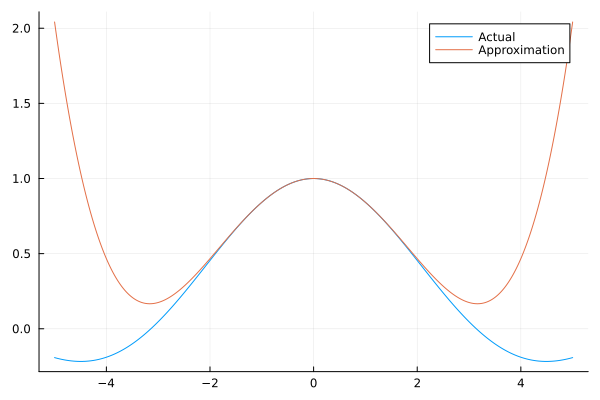

In [5]:
f_approx(x) = 1 - x^2/factorial(3) + x^4/factorial(5)

function f(x)
    return x == 0 ? 1 : sin(x)/x  # if x = 0, return 1 to handle the singularity at 0 
end

val_range = -5:0.0001:5
values = f_approx.(val_range);

using Plots
plot(val_range,f.(val_range), label = "Actual")
plot!(val_range,f_approx.(val_range), label = "Approximation")

b) $f(x) = 3^x$

Recall again the taylor expansion around 0:

$$
f(x) \approx \frac{f^0(0)}{0!}(x)^0 + \frac{f^1(0)}{1!}(x)^1 + \frac{f^2(0)}{2!}(x)^2 + \dots 
$$

$$
\begin{align}
f(x) &= e^{\ln{(3^x)}} = e^{x\ln{(3)}} \\ 
f'(x) &= \frac{d(e^{x\ln{3}})}{dx} = e^{x\ln{3}}\ln{3} = 3^x\ln{3} \\
f''(x) &= \frac{d(3^x\ln{3})}{dx} = (3^x\ln{3})\ln{3} = 3^x(\ln{3})^2
\end{align}
$$


thus the first 3 terms of $f(x)$ :

$$ 
f(x) = \frac{e^{x\ln{3}}}{0!}(x)^0 + \frac{3^x\ln{3}}{1!}(x)^1
$$

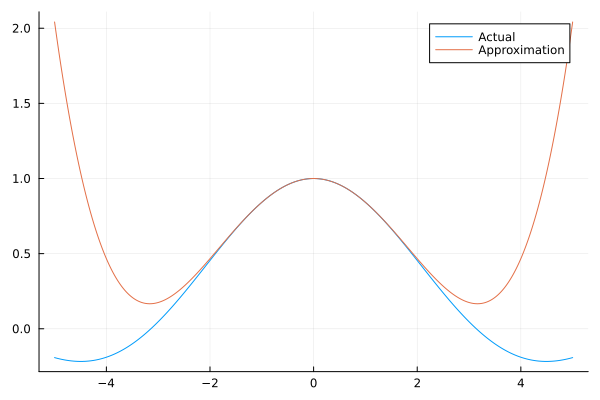

In [6]:
f_approx(x) = 1 - x^2/factorial(3) + x^4/factorial(5)

function f(x)
    return x == 0 ? 1 : sin(x)/x  # if x = 0, return 1 to handle the singularity at 0 
end

val_range = -5:0.0001:5
values = f_approx.(val_range);

using Plots
plot(val_range,f.(val_range), label = "Actual")
plot!(val_range,f_approx.(val_range), label = "Approximation")

$$

$$


## Exercise 1-4

Please compute an analytic expression, by hand, for the real and imaginary parts
of the following complex functions. Please also plot these for t=0:.01:10.

a) $f(t) = e^{it}$

Recall Euler's formula of $e^t$:

$$
e^{it} = isin(t) + cos(t)
$$

<!-- ````{div} full-width
$$
\begin{align}
e^{i t} &= 1 + it -\frac{t^2}{2!} -\frac{it^3}{3!} + \frac{t^4}{4!} + \frac{it^5}{5!} \dots + \frac{(it)^N}{N!} \\
&= (it - \frac{it^3}{3!} + \frac{it5}{5!} - \dots) + (1 -\frac{t^2}{2!} + \frac{t^4}{4!} + \dots) \quad{
    \text{Group the $it$ terms together}
}\\
&= i(t - \frac{t^3}{3!} + \frac{t^5}{5!} - \dots )  + (1 -\frac{t^2}{2!} + \frac{t^4}{4!} + \dots) \quad{\text{The isolated terms correspond to the Taylor series of $sin(t)$ and $cos(t)$}} \\
&= isin(t) + cos(t)
\end{align}
$$
```` -->

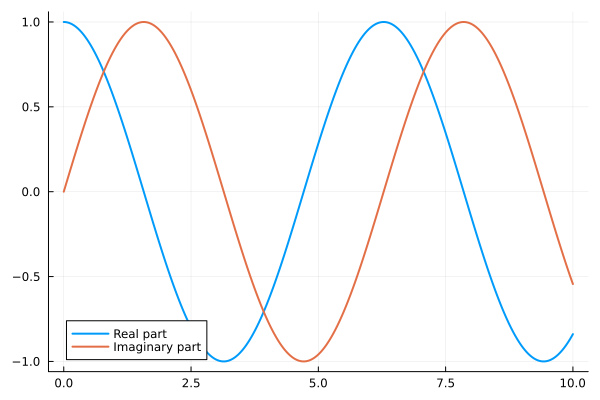

In [7]:
#f_approx(x) = 1 - x^2/factorial(3) + x^4/factorial(5)

f(x) = im*sin(x) + cos(x)

val_range = 0:.01:10

plot(val_range, real.(f.(val_range)), label="Real part", lw=2)
plot!(val_range, imag.(f.(val_range)), label="Imaginary part", lw=2)


b) $f(t) = e^{(-1-i)t}$

````{div} full-width
$$
\begin{align}
f(t) &= e^{(-1-i)t} = e^{-t-it} \\
     &= e^{(-t + (-it))} \\
     &= e^{-t}e^{-it} &\quad{\text{By exponent rule $b^{m+n} = b^mb^n$}}\\
     &= e^{-t}(-isin(t) + cos(t)) &\quad{\text{By Euler's formula}} \\
     &= -e^{-t}isin(t) + e^{-t}cos(t) &\quad{\text{Seperating out the imaginary and real terms}}
\end{align}
$$
````

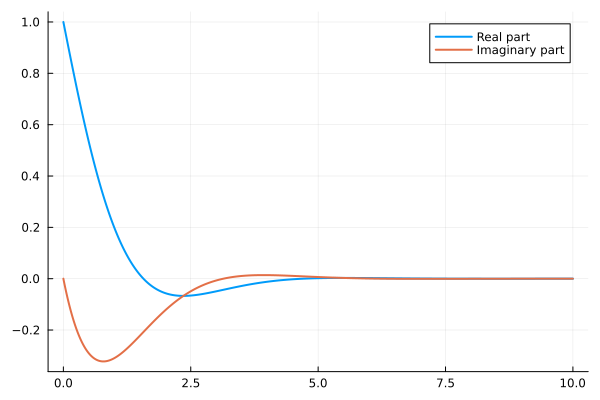

In [9]:

f(t) = -exp(-t)*im*sin(t) + exp(-t)cos(t)

val_range = 0:.01:10

plot(val_range, real.(f.(val_range)), label="Real part", lw=2)
plot!(val_range, imag.(f.(val_range)), label="Imaginary part", lw=2)